Firstly, let's define all the functions we are going to need.

In [2]:
import requests
from bs4 import BeautifulSoup
import time
from PIL import Image, ImageDraw
import face_recognition
import pandas as pd
import numpy as np
from os.path import basename
import math
import pathlib
from pathlib import Path
import os
import random
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image, ImageDraw,ImageFont
import numpy as np
from tqdm import tqdm
import face_recognition

import warnings
warnings.filterwarnings('ignore')

# DISTANCE 
def distance(p1,p2):
    dx = p2[0] - p1[0]
    dy = p2[1] - p1[1]
    return math.sqrt(dx*dx+dy*dy)

# ROTATE
def scale_rotate_translate(image, angle, center = None, new_center = None, scale = None, resample=Image.BICUBIC):
    if (scale is None) and (center is None):
        return image.rotate(angle=angle, resample=resample)
    nx,ny = x,y = center
    sx=sy=1.0
    if new_center:
        (nx,ny) = new_center
    if scale:
        (sx,sy) = (scale, scale)
    cosine = math.cos(angle)
    sine = math.sin(angle)
    a = cosine/sx
    b = sine/sx
    c = x-nx*a-ny*b
    d = -sine/sy
    e = cosine/sy
    f = y-nx*d-ny*e
    return image.transform(image.size, Image.AFFINE, (a,b,c,d,e,f), resample=resample)

# CROP
def crop_face(image, eye_left=(0,0), eye_right=(0,0), offset_pct=(0.3,0.3), dest_sz = (600,600)):
    # calculate offsets in original image
    offset_h = math.floor(float(offset_pct[0])*dest_sz[0])
    offset_v = math.floor(float(offset_pct[1])*dest_sz[1])
    # get the direction
    eye_direction = (eye_right[0] - eye_left[0], eye_right[1] - eye_left[1])
    # calc rotation angle in radians
    rotation = -math.atan2(float(eye_direction[1]),float(eye_direction[0]))
    #print(rotation)
    # distance between them
    dist = distance(eye_left, eye_right)
    # calculate the reference eye-width
    reference = dest_sz[0] - 2.0*offset_h
    # scale factor
    scale = float(dist)/float(reference)
    # rotate original around the left eye

    image = scale_rotate_translate(image, center=eye_left, angle=rotation)
    # crop the rotated image
    crop_xy = (eye_left[0] - scale*offset_h, eye_left[1] - scale*offset_v)
    crop_size = (dest_sz[0]*scale, dest_sz[1]*scale)
    image = image.crop((int(crop_xy[0]), int(crop_xy[1]), int(crop_xy[0]+crop_size[0]), int(crop_xy[1]+crop_size[1])))
    # resize it
    image = image.resize(dest_sz, Image.ANTIALIAS)
    return image


# MAKE FACE
def make_face_df(image_select,filenum): 
    # This function looks at one image, draws points and saves points to DF
    pts = []
    # filenum = 0   # need this to iterate through the dataframe to append rows
    face = 0
    image = face_recognition.load_image_file(image_select)
    face_landmarks_list = face_recognition.face_landmarks(image)
    
    for face_landmarks in face_landmarks_list:
        face += 1
        if face >1:    # this will only measure one face per image
            break
        else:
            # Print the location of each facial feature in this image
            facial_features = [
                'chin',
                'left_eyebrow',
                'right_eyebrow',
                'nose_bridge',
                'nose_tip',
                'left_eye',
                'right_eye',
                'top_lip',
                'bottom_lip'
                ]

            for facial_feature in facial_features:
                # put each point in a COLUMN
                for  point in  face_landmarks[facial_feature]:
                    for pix in point:
                        pts.append(pix)
               
        pil_image = Image.fromarray(image)
        d = ImageDraw.Draw(pil_image)   
        
        eyes = []
        lex = pts[72]
        ley = pts[73]
        rex = pts[90]
        rey = pts[91]
        eyes.append(pts[72:74])
        eyes.append(pts[90:92])

        image =  Image.open(image_select)
        crop_image = crop_face(image, eye_left=(lex, ley), eye_right=(rex, rey), offset_pct=(0.34,0.34), dest_sz=(300,300))
        try:
            crop_image.save(str(image_select)+"_NEW_cropped.jpg")
        except:
            continue
        # crop_image.show()
        
        nn = str(image_select)+"_NEW_cropped.jpg"
        pts = []
        face = 0
        image = face_recognition.load_image_file(nn)
        face_landmarks_list = face_recognition.face_landmarks(image)

        for face_landmarks in face_landmarks_list:
            face += 1
            if face >1:    # this will only measure one face per image
                break
            else:
                # Print the location of each facial feature in this image
                facial_features2 = [
                    'chin',
                    'left_eyebrow',
                    'right_eyebrow',
                    'nose_bridge',
                    'nose_tip',
                    'left_eye',
                    'right_eye',
                    'top_lip',
                    'bottom_lip'
                    ]

                for facial_feature in facial_features2:
                    # put each point in a COLUMN
                    for  point in  face_landmarks[facial_feature]:
                        for pix in point:
                            pts.append(pix)

            i = 0
            for j in range(0,17):
                if i != 16:
                    if i != 17:
                        px = pts[i]
                        py = pts[i+1]
                        chin_x = pts[16]   # always the chin x
                        chin_y = pts[17]   # always the chin y

                        x_diff = float(px - chin_x)

                        if(py == chin_y): 
                            y_diff = 0.1
                        if(py < chin_y): 
                            y_diff = float(np.absolute(py-chin_y))
                        if(py > chin_y):
                            y_diff = 0.1
                            print("Error: facial feature is located below the chin.")

                        angle = np.absolute(math.degrees(math.atan(x_diff/y_diff)))

                        pts.append(angle)
                i += 2
        
            pil_image = Image.fromarray(image)
            d = ImageDraw.Draw(pil_image)

            for facial_feature in facial_features2:
                    #d.line(face_landmarks[facial_feature], width=5)
                    d.point(face_landmarks[facial_feature], fill = (255,255,255))
            
            pil_image.save(str(image_select) + '_NEW_rotated_pts.jpg', 'JPEG', quality = 100)
            
            # take_measurements width & height measurements
        msmt = []
        a = pts[0]   ## point 1 x - left side of face 
        b = pts[1]   ## point 1 y
        c = pts[32]  ## point 17 x - right side of face
        d = pts[33]  ## point 17 y

        e = pts[16]  ## point 9 x - chin
        f = pts[17]  ## point 9 y - chin
        #Visual inspection indicates that point 29 is the middle of the face, 
        #so the height of the face is 2X the height between chin & point 29 which are coordinates 56 and 57     
        g = pts[56]  # point 29's x coordinate (mid-face point)
        h = pts[57]   # point 29's y coordinate
        
        i = pts[12]    # point 7 x   for jaw width 
        j = pts[13]    # point 7 y   for jaw width
        k = pts[20]    # point 11 x  for jaw width
        l = pts[21]    # point 11 y  for jaw width
             
        m = pts[8]     # point 5 x   for mid jaw width    
        n = pts[9]     # point 5 y   for mid jaw width  
        o = pts[24]    # point 13 x   for mid jaw width  
        p = pts[25]    # point 13 y   for mid jaw width  


        face_width = np.sqrt(np.square(a - c) + np.square(b - d))
        pts.append(face_width)
        face_height = np.sqrt(np.square(e - g) + np.square(f - h)) * 2   # double the height to the mid-point
        pts.append(face_height)
        height_to_width = face_height/face_width
        
        pts.append(height_to_width)
        
        # JAW width (7-11)
        jaw_width = np.sqrt(np.square(i-k) + np.square(j-l))
        pts.append(jaw_width)
        jaw_width_to_face_width =  jaw_width/face_width
        pts.append(jaw_width_to_face_width)
        
        # mid-JAW width (5-13)
        mid_jaw_width = np.sqrt(np.square(m-o) + np.square(n-p))
        pts.append(mid_jaw_width)
        mid_jaw_width_to_jaw_width =  mid_jaw_width/jaw_width
        pts.append(mid_jaw_width_to_jaw_width)
        
        ### end of new ###
            
        df.loc[filenum] = np.array(pts)

In [3]:
def make_face_df_save(image_select,filenum,df):
    
    # This function looks at one image, draws points and saves points to DF
    pts = []
   # filenum = 0   # need this to iterate through the dataframe to append rows
    face = 0
    image = face_recognition.load_image_file(image_select)
    face_landmarks_list = face_recognition.face_landmarks(image)
    
    for face_landmarks in face_landmarks_list:
        face += 1
        if face >1:    # this will only measure one face per image
            break
        else:
            # Print the location of each facial feature in this image
            facial_features = [
                'chin',
                'left_eyebrow',
                'right_eyebrow',
                'nose_bridge',
                'nose_tip',
                'left_eye',
                'right_eye',
                'top_lip',
                'bottom_lip'
                ]

            for facial_feature in facial_features:
                # put each point in a COLUMN
                for  point in  face_landmarks[facial_feature]:
                    for pix in point:
                        pts.append(pix)
               
        pil_image = Image.fromarray(image)
        d = ImageDraw.Draw(pil_image)
        
        eyes = []
        lex = pts[72]
        ley = pts[73]
        rex = pts[90]
        rey = pts[91]
        eyes.append(pts[72:74])
        eyes.append(pts[90:92])

        image =  Image.open(image_select)
        crop_image = crop_face(image, eye_left=(lex, ley), eye_right=(rex, rey), offset_pct=(0.34,0.34), dest_sz=(300,300))
        try:
            crop_image.save(str(image_select)+"_NEW_cropped.jpg")
        except:
            continue
        #crop_image.show()
        
        nn = str(image_select)+"_NEW_cropped.jpg"
        pts = []
        face = 0
        image = face_recognition.load_image_file(nn)
        face_landmarks_list = face_recognition.face_landmarks(image)

        for face_landmarks in face_landmarks_list:
            face += 1
            if face >1:    # this will only measure one face per image
                break
            else:
                # Print the location of each facial feature in this image
                facial_features2 = [
                    'chin',
                    'left_eyebrow',
                    'right_eyebrow',
                    'nose_bridge',
                    'nose_tip',
                    'left_eye',
                    'right_eye',
                    'top_lip',
                    'bottom_lip'
                    ]

                for facial_feature in facial_features2:
                    # put each point in a COLUMN
                    for  point in  face_landmarks[facial_feature]:
                        for pix in point:
                            pts.append(pix)

            i = 0
            for j in range(0,17):
                if i != 16:
                    if i != 17:
                        px = pts[i]
                        py = pts[i+1]
                        chin_x = pts[16]   # always the chin x
                        chin_y = pts[17]   # always the chin y

                        x_diff = float(px - chin_x)

                        if(py == chin_y): 
                            y_diff = 0.1
                        if(py < chin_y): 
                            y_diff = float(np.absolute(py-chin_y))
                        if(py > chin_y):
                            y_diff = 0.1
                            print("Error: facial feature is located below the chin.")

                        angle = np.absolute(math.degrees(math.atan(x_diff/y_diff)))

                        pts.append(angle)
                i += 2
        
            pil_image = Image.fromarray(image)
            d = ImageDraw.Draw(pil_image)

            for facial_feature in facial_features2:
                    #d.line(face_landmarks[facial_feature], width=5)
                    d.point(face_landmarks[facial_feature], fill = (255,255,255))
            
            
            pil_image.save(str(image_select) + '_NEW_rotated_pts.jpg', 'JPEG', quality = 100)

            # take_measurements width & height measurements
        msmt = []
        a = pts[0]   ## point 1 x - left side of face 
        b = pts[1]   ## point 1 y
        c = pts[32]  ## point 17 x - right side of face
        d = pts[33]  ## point 17 y

        e = pts[16]  ## point 9 x - chin
        f = pts[17]  ## point 9 y - chin
        #Visual inspection indicates that point 29 is the middle of the face, 
        #so the height of the face is 2X the height between chin & point 29 which are coordinates 56 and 57     
        g = pts[56]  # point 29's x coordinate (mid-face point)
        h = pts[57]   # point 29's y coordinate
        
        i = pts[12]    # point 7 x   for jaw length 
        j = pts[13]    # point 7 y   for jaw length
        k = pts[20]    # point 11 x  for jaw length
        l = pts[21]    # point 11 y  for jaw length
             
        m = pts[8]     # point 5 x   for lower jaw length     
        n = pts[9]     # point 5 y
        o = pts[24]     # point 13 x
        p = pts[25]     # point 13 y

        face_width = np.sqrt(np.square(a - c) + np.square(b - d))
        #print(face_width)
        pts.append(face_width)
        face_height = np.sqrt(np.square(e - g) + np.square(f - h)) * 2   # double the height to the mid-point
        #print(face_height)
        pts.append(face_height)
        height_to_width = face_height/face_width
        
        pts.append(height_to_width)
        
        # JAW width (7-11)
        jaw_width = np.sqrt(np.square(i-k) + np.square(j-l))
        pts.append(jaw_width)
        jaw_width_to_face_width =  jaw_width/face_width
        pts.append(jaw_width_to_face_width)
        
        # mid-JAW width (5-13)
        mid_jaw_width = np.sqrt(np.square(m-o) + np.square(n-p))
        pts.append(mid_jaw_width)
        mid_jaw_width_to_jaw_width =  mid_jaw_width/jaw_width
        pts.append(mid_jaw_width_to_jaw_width)
        
        ### end of new ###
            
        df.loc[filenum] = np.array(pts)
        #imshow(pil_image, cmap='gray')

The function *make_face_df* is the primary function for feature development. For each image, the function identifies each of the facial features utilizing `face_recognition`. Using the eyes as the pivot point, it rotates the face so it is facing forward. It also crops the photos so that every image has the same dimensions and the eyes are locked into the same place on each photo.

<img src="face_points.jpg" alt="face_points" style="width: 600px;"/>

Since all of the images are cropped and aligned to the same point, we can now compare lengths as an absolute number.

The `face_recognition` package does not provide a top point of the head, so on the basis of a few observations, we determined the half-way point on the face is point 29, so we used double the distance between the chin and point 29 to determine *face height*.

The function *make_face* identifies the location of the facial features using the new aligned/cropped image. We developed 23 additional features. For the first 16 features, we calculated the angles between the chin point (point 9) and each of the jaw line points (1-8, 10-17). Additionally, we added *face width* (the distance from point 1 to point 17), *face height* (described above), the *ratio between them*, the *jaw width* (distance between points 7 and 11), the *jaw width to face width ratio*, the *mid-jaw width* (distance between points 5 and 13), and the *mid-jaw width to jaw width ratio*.

## Intrduction

We are going to work with two datasets. The first dataset comprises a total of 750 images of female celebrities from all around the globe that is categorized according to their face shape namely: Heart, Long, Oval, Round, and Square. Each category consists of 150 images. The Training Set of each category contains 140 images whereas the Testing Set contains 10 images. 

The second dataset comprises a total of 750 images of male celebrities from all around the globe and they are also categorized according to their face shape. Each category consists of 150 images. The Training Set of each category contains 140 images whereas the Testing Set contains 10 images.

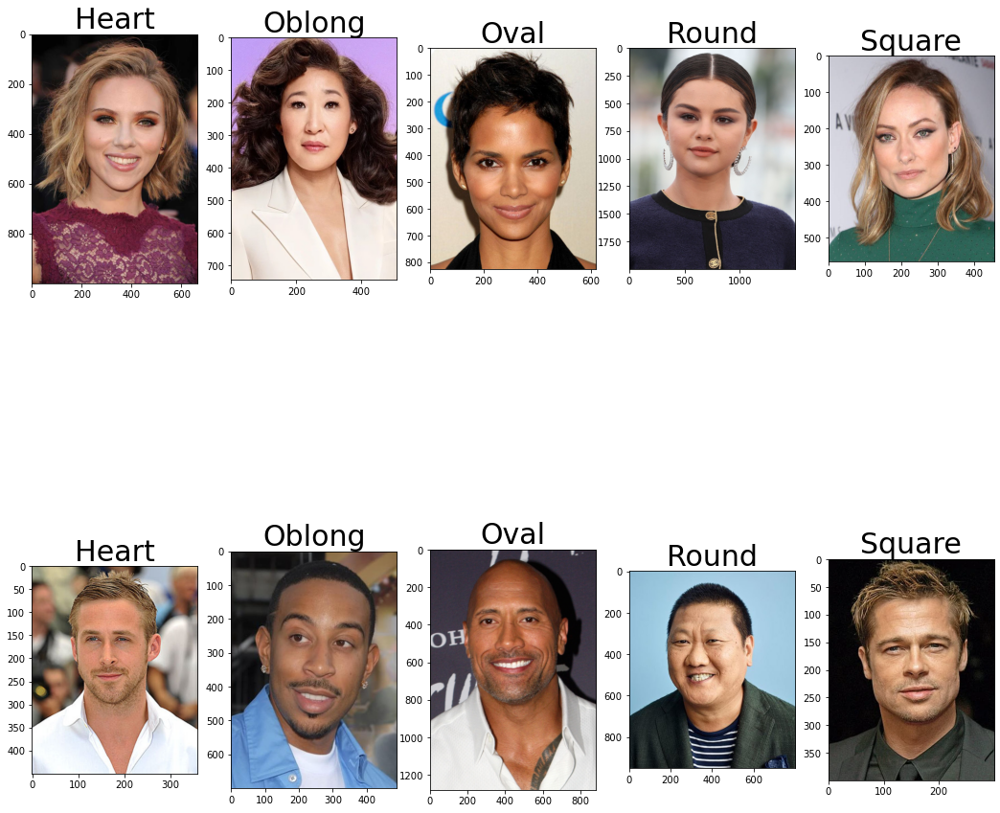

In [4]:
plt.figure(figsize = (18,18))

# NEED TO CHANGE THE DIRECTORY
examples = ['./dataset/training_set/Female/Heart/heart (946).jpg',
            './dataset/training_set/Female/Oblong/oblong (18).jpg',
            './dataset/training_set/Female/Oval/oval (740).jpg',
            './dataset/training_set/Female/Round/round (21).jpg',
            './dataset/training_set/Female/Square/square (99).jpg',
            './dataset/training_set/Male/Heart/Heart13.jpg',
            './dataset/training_set/Male/Oblong/Oblong145.png',
            './dataset/training_set/Male/Oval/Oval40.png',
            './dataset/training_set/Male/Round/Round134.png',
            './dataset/training_set/Male/Square/Square83.png']

names = ['Heart','Oblong','Oval','Round','Square',
        'Heart','Oblong','Oval','Round','Square']

for i in range(0,len(examples)):
    plt.subplot(2,5,i+1)
    img = Image.open(examples[i])
    #draw = ImageDraw.Draw(img)
    plt.imshow(img)
    plt.title(names[i],fontsize= 30)
    img.close()

## Pre-processing

In [476]:
# FEMALE - TRAINING
df = pd.DataFrame(columns = ['0','1','2','3','4','5','6','7','8','9','10','11',	'12',	'13',	'14',	'15',	'16','17',
                             '18',	'19',	'20',	'21',	'22',	'23',	'24','25',	'26',	'27',	'28',	'29',
                             '30',	'31',	'32',	'33',	'34',	'35',	'36',	'37',	'38',	'39',	'40',	'41',
                             '42',	'43',	'44',	'45',	'46',	'47',	'48',	'49',	'50',	'51',	'52',	'53',
                             '54',	'55',	'56',	'57',	'58',	'59',	'60',	'61',	'62',	'63',	'64',	'65',
                             '66',	'67',	'68',	'69',	'70',	'71',	'72',	'73',	'74',	'75',	'76',	'77',
                             '78',	'79',	'80',	'81',	'82',	'83',	'84',	'85',	'86',	'87',	'88',	'89',
                             '90',	'91',	'92',	'93',	'94',	'95',	'96',	'97',	'98',	'99',	'100',	'101',
                             '102',	'103',	'104',	'105',	'106',	'107',	'108',	'109',	'110',	'111',	'112',	'113',
                             '114',	'115',	'116',	'117',	'118',	'119',	'120',	'121',	'122',	'123',	'124',	'125',
                             '126',	'127',	'128',	'129',	'130',	'131',	'132',	'133',	'134',	'135',	'136',	'137',
                             '138',	'139',	'140',	'141',	'142',	'143','A1','A2','A3','A4','A5','A6','A7','A8','A9',
                            'A10','A11','A12','A13','A14','A15','A16','Width','Height','H_W_Ratio','Jaw_width','J_F_Ratio',
                             'MJ_width','MJ_J_width'])

image_dir = "dataset/training_set/Female"
data = pd.DataFrame()
data.reset_index
shape_df = pd.DataFrame(columns = ['filenum','filename','classified_shape'])
shape_array = []
def store_features_and_classification():
    filenum = -1
    sub_dir = [q for q in pathlib.Path(image_dir).iterdir() if q.is_dir()]
    start_j = 0
    end_j = len(sub_dir)

    for j in range(start_j, end_j): # 1-5
        images_dir = [p for p in pathlib.Path(sub_dir[j]).iterdir() if p.is_file()]
        start_i = 0
        end_i = len(images_dir)
        
        for p in tqdm(range(start_i, end_i)):

            shape_array= []
            if 1 == 1:
                    face_file_name = os.path.basename(images_dir[p])
                    classified_face_shape = os.path.basename(os.path.dirname(images_dir[p])) 
                    filenum += 1
                    make_face_df(images_dir[p],filenum)
                    shape_array.append(filenum)
                    shape_array.append(face_file_name)  
                    shape_array.append(classified_face_shape)
                    shape_df.loc[filenum] = np.array(shape_array)
            
#store_features_and_classification()  
#data = pd.concat([df, shape_df], axis=1)

## SAVE THE DATA TO CSV
#data.to_csv('female_training.csv')

 16%|█████████████▎                                                                   | 23/140 [00:10<01:37,  1.20it/s]

Error: facial feature is located below the chin.


100%|████████████████████████████████████████████████████████████████████████████████| 140/140 [01:13<00:00,  1.91it/s]


In [477]:
# MALE - TRAINING
df = pd.DataFrame(columns = ['0','1','2','3','4','5','6','7','8','9','10','11',	'12',	'13',	'14',	'15',	'16','17',
                             '18',	'19',	'20',	'21',	'22',	'23',	'24','25',	'26',	'27',	'28',	'29',
                             '30',	'31',	'32',	'33',	'34',	'35',	'36',	'37',	'38',	'39',	'40',	'41',
                             '42',	'43',	'44',	'45',	'46',	'47',	'48',	'49',	'50',	'51',	'52',	'53',
                             '54',	'55',	'56',	'57',	'58',	'59',	'60',	'61',	'62',	'63',	'64',	'65',
                             '66',	'67',	'68',	'69',	'70',	'71',	'72',	'73',	'74',	'75',	'76',	'77',
                             '78',	'79',	'80',	'81',	'82',	'83',	'84',	'85',	'86',	'87',	'88',	'89',
                             '90',	'91',	'92',	'93',	'94',	'95',	'96',	'97',	'98',	'99',	'100',	'101',
                             '102',	'103',	'104',	'105',	'106',	'107',	'108',	'109',	'110',	'111',	'112',	'113',
                             '114',	'115',	'116',	'117',	'118',	'119',	'120',	'121',	'122',	'123',	'124',	'125',
                             '126',	'127',	'128',	'129',	'130',	'131',	'132',	'133',	'134',	'135',	'136',	'137',
                             '138',	'139',	'140',	'141',	'142',	'143','A1','A2','A3','A4','A5','A6','A7','A8','A9',
                            'A10','A11','A12','A13','A14','A15','A16','Width','Height','H_W_Ratio','Jaw_width','J_F_Ratio',
                             'MJ_width','MJ_J_width'])

image_dir = "dataset/training_set/Male"
data = pd.DataFrame()
data.reset_index
shape_df = pd.DataFrame(columns = ['filenum','filename','classified_shape'])
shape_array = []
def store_features_and_classification():
    filenum = -1
    sub_dir = [q for q in pathlib.Path(image_dir).iterdir() if q.is_dir()]
    start_j = 0
    end_j = len(sub_dir)

    for j in range(start_j, end_j): # 1-5
        images_dir = [p for p in pathlib.Path(sub_dir[j]).iterdir() if p.is_file()]
        start_i = 0
        end_i = len(images_dir)
        #print(images_dir[j])
        
        for p in tqdm(range(start_i, end_i)):

            shape_array= []
            if 1 == 1:
                    face_file_name = os.path.basename(images_dir[p])
                    classified_face_shape = os.path.basename(os.path.dirname(images_dir[p])) 
                    filenum += 1
                    make_face_df(images_dir[p],filenum)
                    shape_array.append(filenum)
                    shape_array.append(face_file_name)  
                    shape_array.append(classified_face_shape)
                    shape_df.loc[filenum] = np.array(shape_array)
            
#store_features_and_classification()  
#data = pd.concat([df, shape_df], axis=1)

## SAVE THE DATA TO CSV
#data.to_csv('male_training.csv')

 79%|███████████████████████████████████████████████████████████████▍                | 111/140 [01:04<00:15,  1.89it/s]

Error: facial feature is located below the chin.


100%|████████████████████████████████████████████████████████████████████████████████| 140/140 [01:50<00:00,  1.26it/s]


In [478]:
# FEMALE - TESTING
df = pd.DataFrame(columns = ['0','1','2','3','4','5','6','7','8','9','10','11',	'12',	'13',	'14',	'15',	'16','17',
                             '18',	'19',	'20',	'21',	'22',	'23',	'24','25',	'26',	'27',	'28',	'29',
                             '30',	'31',	'32',	'33',	'34',	'35',	'36',	'37',	'38',	'39',	'40',	'41',
                             '42',	'43',	'44',	'45',	'46',	'47',	'48',	'49',	'50',	'51',	'52',	'53',
                             '54',	'55',	'56',	'57',	'58',	'59',	'60',	'61',	'62',	'63',	'64',	'65',
                             '66',	'67',	'68',	'69',	'70',	'71',	'72',	'73',	'74',	'75',	'76',	'77',
                             '78',	'79',	'80',	'81',	'82',	'83',	'84',	'85',	'86',	'87',	'88',	'89',
                             '90',	'91',	'92',	'93',	'94',	'95',	'96',	'97',	'98',	'99',	'100',	'101',
                             '102',	'103',	'104',	'105',	'106',	'107',	'108',	'109',	'110',	'111',	'112',	'113',
                             '114',	'115',	'116',	'117',	'118',	'119',	'120',	'121',	'122',	'123',	'124',	'125',
                             '126',	'127',	'128',	'129',	'130',	'131',	'132',	'133',	'134',	'135',	'136',	'137',
                             '138',	'139',	'140',	'141',	'142',	'143','A1','A2','A3','A4','A5','A6','A7','A8','A9',
                            'A10','A11','A12','A13','A14','A15','A16','Width','Height','H_W_Ratio','Jaw_width','J_F_Ratio',
                             'MJ_width','MJ_J_width'])

image_dir = "dataset/testing_set/Female"
data = pd.DataFrame()
data.reset_index
shape_df = pd.DataFrame(columns = ['filenum','filename','classified_shape'])
shape_array = []
def store_features_and_classification():
    filenum = -1
    sub_dir = [q for q in pathlib.Path(image_dir).iterdir() if q.is_dir()]
    start_j = 0
    end_j = len(sub_dir)

    for j in range(start_j, end_j): # 1-5
        images_dir = [p for p in pathlib.Path(sub_dir[j]).iterdir() if p.is_file()]
        start_i = 0
        end_i = len(images_dir)
        #print(images_dir[j])
        
        for p in tqdm(range(start_i, end_i)):

            shape_array= []
            if 1 == 1:
                    face_file_name = os.path.basename(images_dir[p])
                    classified_face_shape = os.path.basename(os.path.dirname(images_dir[p])) 
                    filenum += 1
                    make_face_df(images_dir[p],filenum)
                    shape_array.append(filenum)
                    shape_array.append(face_file_name)  
                    shape_array.append(classified_face_shape)
                    shape_df.loc[filenum] = np.array(shape_array)
            
#store_features_and_classification()  
#data = pd.concat([df, shape_df], axis=1)

## SAVE THE DATA TO CSV
#data.to_csv('female_testing.csv')

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.68it/s]


In [82]:
# MALE - TESTING
df = pd.DataFrame(columns = ['0','1','2','3','4','5','6','7','8','9','10','11',	'12',	'13',	'14',	'15',	'16','17',
                             '18',	'19',	'20',	'21',	'22',	'23',	'24','25',	'26',	'27',	'28',	'29',
                             '30',	'31',	'32',	'33',	'34',	'35',	'36',	'37',	'38',	'39',	'40',	'41',
                             '42',	'43',	'44',	'45',	'46',	'47',	'48',	'49',	'50',	'51',	'52',	'53',
                             '54',	'55',	'56',	'57',	'58',	'59',	'60',	'61',	'62',	'63',	'64',	'65',
                             '66',	'67',	'68',	'69',	'70',	'71',	'72',	'73',	'74',	'75',	'76',	'77',
                             '78',	'79',	'80',	'81',	'82',	'83',	'84',	'85',	'86',	'87',	'88',	'89',
                             '90',	'91',	'92',	'93',	'94',	'95',	'96',	'97',	'98',	'99',	'100',	'101',
                             '102',	'103',	'104',	'105',	'106',	'107',	'108',	'109',	'110',	'111',	'112',	'113',
                             '114',	'115',	'116',	'117',	'118',	'119',	'120',	'121',	'122',	'123',	'124',	'125',
                             '126',	'127',	'128',	'129',	'130',	'131',	'132',	'133',	'134',	'135',	'136',	'137',
                             '138',	'139',	'140',	'141',	'142',	'143','A1','A2','A3','A4','A5','A6','A7','A8','A9',
                            'A10','A11','A12','A13','A14','A15','A16','Width','Height','H_W_Ratio','Jaw_width','J_F_Ratio',
                             'MJ_width','MJ_J_width'])

image_dir = "dataset/testing_set/Male"
data = pd.DataFrame()
data.reset_index
shape_df = pd.DataFrame(columns = ['filenum','filename','classified_shape'])
shape_array = []
def store_features_and_classification():
    filenum = -1
    sub_dir = [q for q in pathlib.Path(image_dir).iterdir() if q.is_dir()]
    start_j = 0
    end_j = len(sub_dir)

    for j in range(start_j, end_j): # -5
        images_dir = [p for p in pathlib.Path(sub_dir[j]).iterdir() if p.is_file()]
        start_i = 0
        end_i = len(images_dir)
        #print(images_dir[j])
        
        for p in tqdm(range(start_i, end_i)):

            shape_array= []
            if 1 == 1:
                    face_file_name = os.path.basename(images_dir[p])
                    classified_face_shape = os.path.basename(os.path.dirname(images_dir[p])) 
                    filenum += 1
                    make_face_df(images_dir[p],filenum)
                    shape_array.append(filenum)
                    shape_array.append(face_file_name)  
                    shape_array.append(classified_face_shape)
                    shape_df.loc[filenum] = np.array(shape_array)
            
#store_features_and_classification()  
#data = pd.concat([df, shape_df], axis=1)

## SAVE THE DATA TO CSV
#data.to_csv('male_testing.csv')

## Exploratory analysis

In [178]:
# LOAD DATA FILE - TRAINING
female = pd.read_csv('female_training.csv',index_col = None)
female = female.drop('Unnamed: 0',axis = 1)
female = female.dropna(axis=0, how='any')
print('Shape of the Female Training Dataset: ',female.shape)

male = pd.read_csv('male_training.csv',index_col = None)
male = male.drop('Unnamed: 0',axis = 1)
male = male.dropna(axis=0, how='any')
print('\nShape of the Male Training Dataset: ',male.shape)

Shape of the Female Training Dataset:  (699, 170)

Shape of the Male Training Dataset:  (697, 170)


In [179]:
import pandas as pd
male['Sex']='Male'
female['Sex']='Female'
data = pd.concat([male,female])
print('Shape of the Training Dataset: ',data.shape)

Shape of the Training Dataset:  (1396, 171)


### Histogram

In [180]:
data = data.dropna(axis=0, how='any')
cols = ['Width','Height','H_W_Ratio','Jaw_width','J_F_Ratio', 'MJ_width','MJ_J_width']
colors = ['b','g','r','orange','c','m','y',]

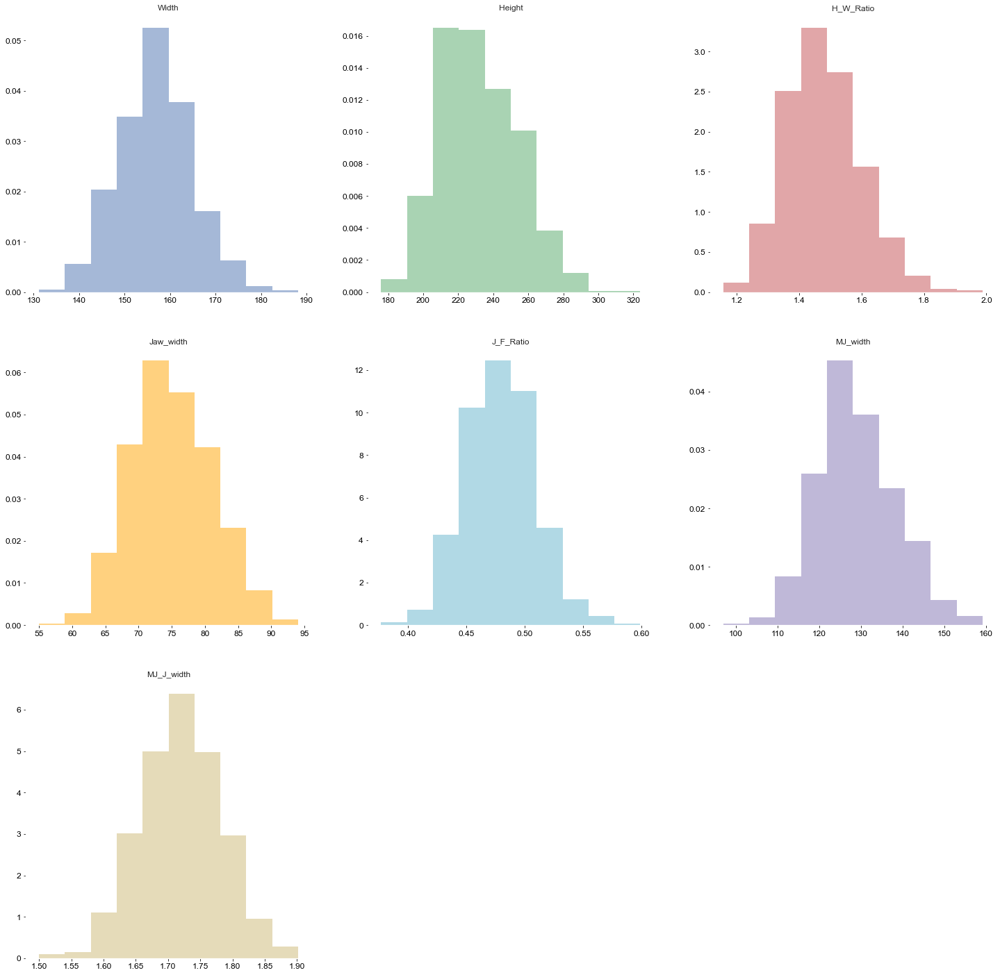

In [181]:
## HISTOGRAMs of created features
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(25,25))

for i in range(0, len(cols)):
    plt.subplot(3,3,i+1)
    plt.hist(data[cols[i]],
             10,
             facecolor=colors[i],
             alpha=0.5,
             density=True)
    plt.title(cols[i])
    
plt.show()

We have created histograms, so we can take a look at the distribution of a few of our created features (the most important ones). From the histograms, we can assume that all the features, more or less, follow the normal distribution. We can observe some deviations in skewness and kurtosis but since we have a decent amount of data it should not bother us.

### Multiple comparsion

In [182]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set() # Setting seaborn as default style even if use only matplotlib

In [183]:
def boxplots(attribute):
    # BOXPLOT
    plt.figure(figsize=(10,8))
    plt.title(attribute,fontsize=20)
    #fig, axes = plt.subplots(5, 1, figsize=(20, 30))
    sns.boxplot(data=data, 
                y='classified_shape', 
                x=attribute, 
                hue="Sex", 
                orient='h')

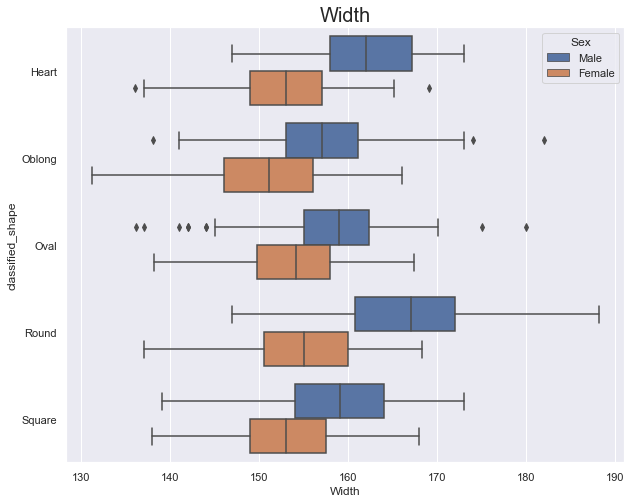

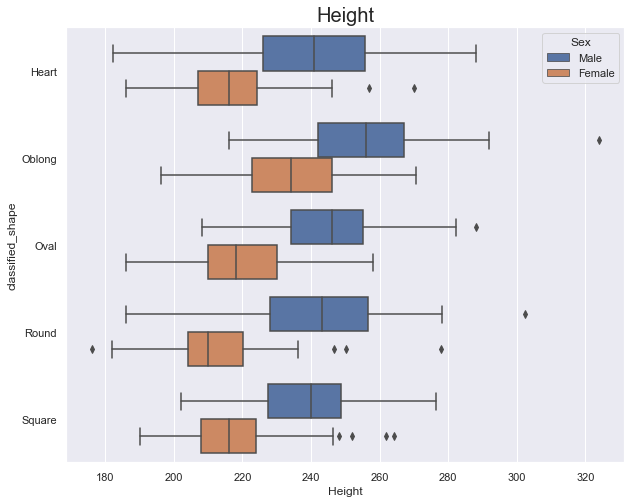

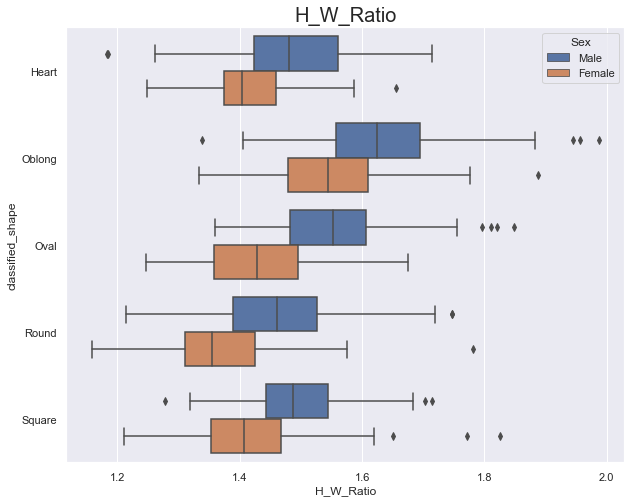

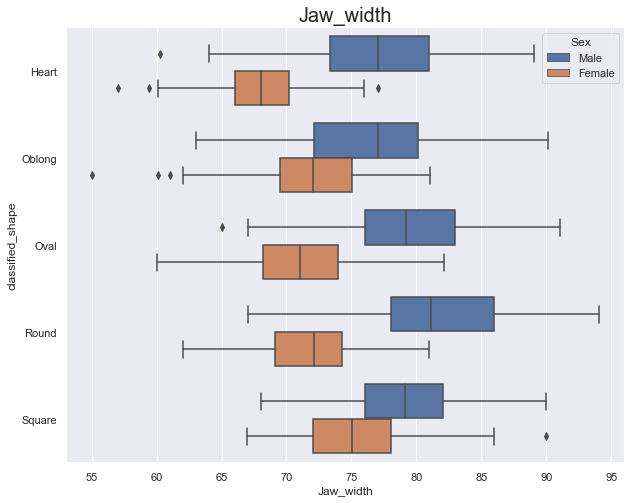

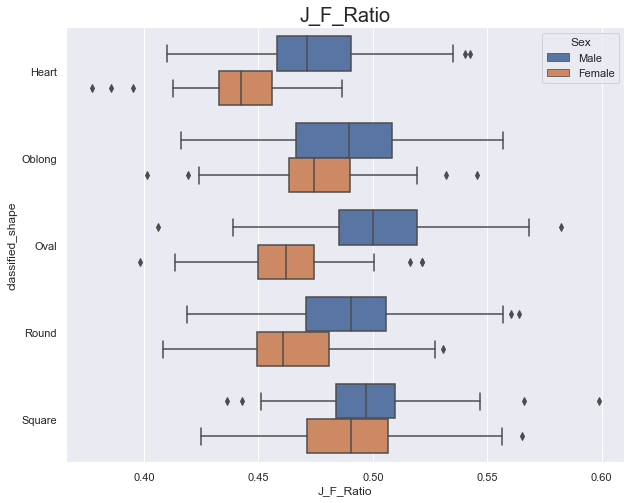

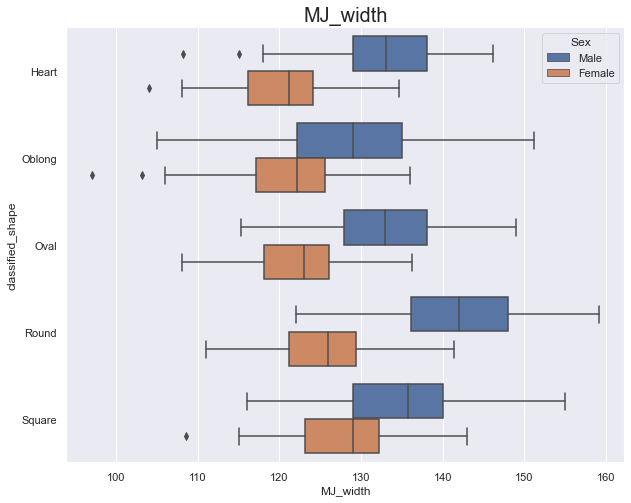

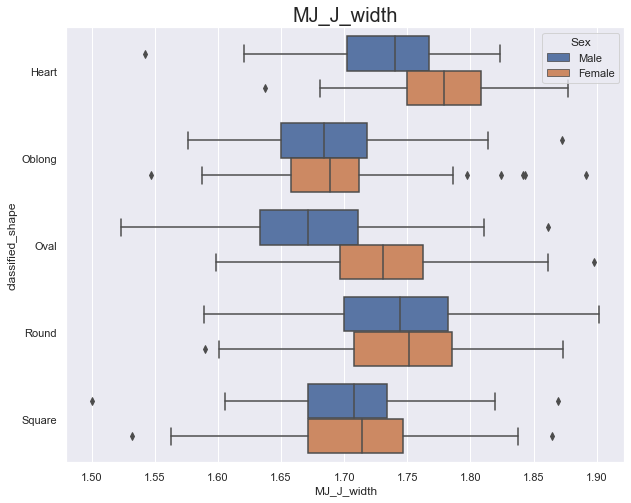

In [184]:
for i in range(0,len(cols)):
    boxplots(cols[i])

In [185]:
def analysis(attribute):
    # BOXPLOT
    print('Boxplot for the:',attribute,'\n')
    data.boxplot(column=attribute, 
                 by='classified_shape',
                 vert=False, 
                 ax=None, 
                 fontsize=12, 
                 rot=0, 
                 grid=False, 
                 figsize=(10,8), 
                 layout=None, 
                 return_type=None) 
    plt.show()
    
    ## TUKEY HSD
    print('\nTukey HSD for the:', attribute, '\n ')
    from scipy.stats import f_oneway
    from statsmodels.stats.multicomp import pairwise_tukeyhsd
    tukey = pairwise_tukeyhsd(endog=data[attribute],
                              groups=data['classified_shape'],
                              alpha=0.05)
    print(tukey)
    print('\n')

Boxplot for the: Width 



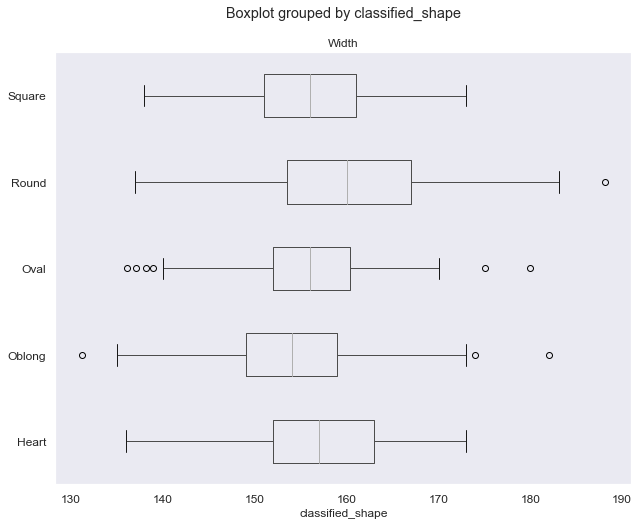


Tukey HSD for the: Width 
 
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 Heart Oblong   -3.534  0.001 -5.3261 -1.7419   True
 Heart   Oval  -1.5247  0.137 -3.3152  0.2658  False
 Heart  Round   2.9115  0.001  1.1194  4.7035   True
 Heart Square  -1.2466 0.3177 -3.0387  0.5455  False
Oblong   Oval   2.0093 0.0188  0.2188  3.7998   True
Oblong  Round   6.4455  0.001  4.6534  8.2375   True
Oblong Square   2.2874 0.0046  0.4953  4.0795   True
  Oval  Round   4.4362  0.001  2.6457  6.2267   True
  Oval Square   0.2781    0.9 -1.5124  2.0686  False
 Round Square  -4.1581  0.001 -5.9501  -2.366   True
----------------------------------------------------


Boxplot for the: Height 



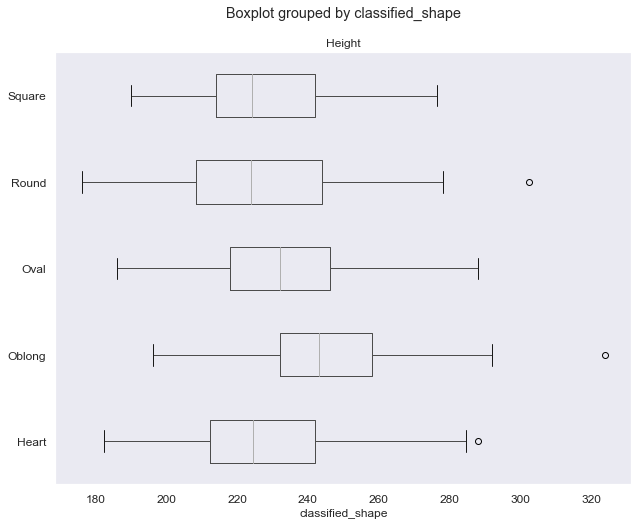


Tukey HSD for the: Height 
 
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
 Heart Oblong  16.0327  0.001  11.2111  20.8544   True
 Heart   Oval     3.48 0.2798  -1.3374   8.2973  False
 Heart  Round  -1.1347    0.9  -5.9563    3.687  False
 Heart Square    -0.89    0.9  -5.7116   3.9317  False
Oblong   Oval -12.5528  0.001 -17.3701  -7.7354   True
Oblong  Round -17.1674  0.001 -21.9891 -12.3458   True
Oblong Square -16.9227  0.001 -21.7444 -12.1011   True
  Oval  Round  -4.6147 0.0681   -9.432   0.2027  False
  Oval Square    -4.37 0.0962  -9.1873   0.4474  False
 Round Square   0.2447    0.9  -4.5769   5.0664  False
------------------------------------------------------


Boxplot for the: H_W_Ratio 



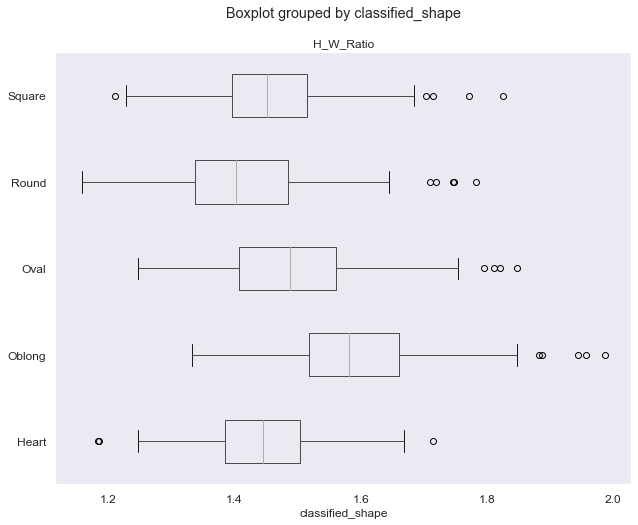


Tukey HSD for the: H_W_Ratio 
 
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
 Heart Oblong   0.1389 0.001  0.1147  0.1632   True
 Heart   Oval   0.0382 0.001  0.0139  0.0624   True
 Heart  Round   -0.033 0.002 -0.0572 -0.0087   True
 Heart Square   0.0074   0.9 -0.0168  0.0317  False
Oblong   Oval  -0.1008 0.001  -0.125 -0.0765   True
Oblong  Round  -0.1719 0.001 -0.1962 -0.1477   True
Oblong Square  -0.1315 0.001 -0.1557 -0.1072   True
  Oval  Round  -0.0711 0.001 -0.0954 -0.0469   True
  Oval Square  -0.0307 0.005 -0.0549 -0.0065   True
 Round Square   0.0404 0.001  0.0162  0.0647   True
---------------------------------------------------


Boxplot for the: Jaw_width 



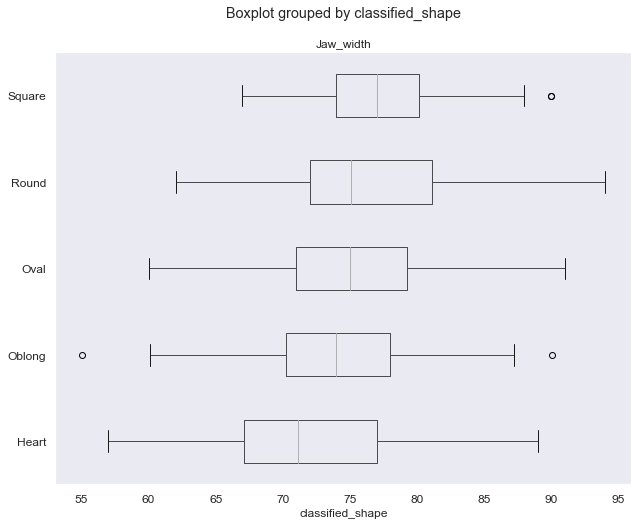


Tukey HSD for the: Jaw_width 
 
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
 Heart Oblong   1.8076 0.0034  0.4233  3.192   True
 Heart   Oval   2.8729  0.001  1.4898  4.256   True
 Heart  Round   4.3285  0.001  2.9442 5.7128   True
 Heart Square   4.8061  0.001  3.4218 6.1904   True
Oblong   Oval   1.0653  0.219 -0.3178 2.4483  False
Oblong  Round   2.5208  0.001  1.1365 3.9052   True
Oblong Square   2.9984  0.001  1.6141 4.3827   True
  Oval  Round   1.4556 0.0334  0.0725 2.8386   True
  Oval Square   1.9332 0.0013  0.5501 3.3162   True
 Round Square   0.4776 0.8705 -0.9067 1.8619  False
---------------------------------------------------


Boxplot for the: J_F_Ratio 



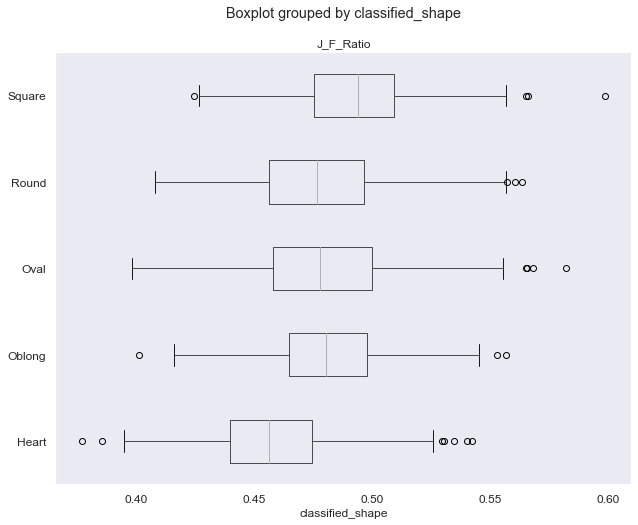


Tukey HSD for the: J_F_Ratio 
 
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
 Heart Oblong   0.0226  0.001  0.0162 0.0289   True
 Heart   Oval   0.0232  0.001  0.0169 0.0296   True
 Heart  Round   0.0188  0.001  0.0124 0.0252   True
 Heart Square   0.0349  0.001  0.0286 0.0413   True
Oblong   Oval   0.0007    0.9 -0.0057  0.007  False
Oblong  Round  -0.0038 0.4886 -0.0101 0.0026  False
Oblong Square   0.0124  0.001   0.006 0.0188   True
  Oval  Round  -0.0044 0.3158 -0.0108 0.0019  False
  Oval Square   0.0117  0.001  0.0053 0.0181   True
 Round Square   0.0161  0.001  0.0098 0.0225   True
---------------------------------------------------


Boxplot for the: MJ_width 



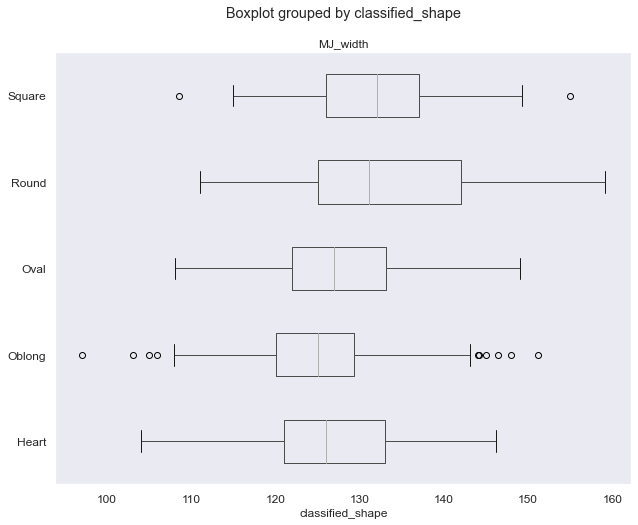


Tukey HSD for the: MJ_width 
 
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 Heart Oblong  -1.7152 0.1507 -3.7667  0.3363  False
 Heart   Oval   0.8259 0.7807 -1.2237  2.8756  False
 Heart  Round   6.7685  0.001   4.717    8.82   True
 Heart Square   4.7425  0.001   2.691   6.794   True
Oblong   Oval   2.5412 0.0065  0.4915  4.5908   True
Oblong  Round   8.4837  0.001  6.4322 10.5352   True
Oblong Square   6.4578  0.001  4.4063  8.5093   True
  Oval  Round   5.9426  0.001  3.8929  7.9922   True
  Oval Square   3.9166  0.001  1.8669  5.9663   True
 Round Square   -2.026 0.0549 -4.0775  0.0255  False
----------------------------------------------------


Boxplot for the: MJ_J_width 



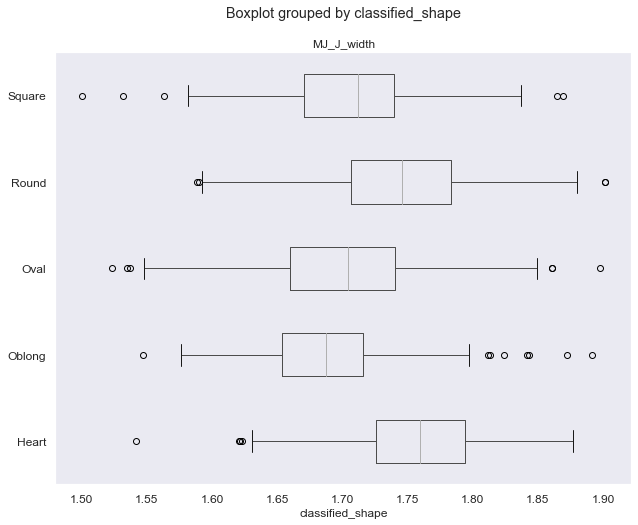


Tukey HSD for the: MJ_J_width 
 
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 Heart Oblong  -0.0674  0.001 -0.0803 -0.0545   True
 Heart   Oval  -0.0557  0.001 -0.0686 -0.0428   True
 Heart  Round  -0.0118 0.0935 -0.0247  0.0011  False
 Heart Square  -0.0493  0.001 -0.0622 -0.0364   True
Oblong   Oval   0.0117 0.0968 -0.0012  0.0246  False
Oblong  Round   0.0556  0.001  0.0427  0.0685   True
Oblong Square    0.018 0.0013  0.0051  0.0309   True
  Oval  Round   0.0439  0.001   0.031  0.0568   True
  Oval Square   0.0064 0.6414 -0.0065  0.0193  False
 Round Square  -0.0376  0.001 -0.0505 -0.0247   True
----------------------------------------------------




In [186]:
## Multiple Comparisons
for i in range(0,len(cols)):
    analysis(cols[i])

We have performed the multiple comparison test in order to find out whether there is a significant difference between the means of different features among the groups. We performed the test on a significance level of 0.05. We can observe the results in the table for each feature. If the last column says True, the groups are significantly different.

We can observe, in most of the cases,  that the groups are significantly different. Therefore, the created attributes can help us classify the face shape. 

## Model Building

In [154]:
# LOAD DATA FILE - TRAINING
female = pd.read_csv('female_training.csv',index_col = None)
#female = pd.read_csv('all_female_training.csv',index_col = None)
female = female.drop('Unnamed: 0',axis = 1)
female = female.dropna(axis=0, how='any')
print('Shape of the Female Training Dataset: ',female.shape)

male = pd.read_csv('male_training.csv',index_col = None)
male = male.drop('Unnamed: 0',axis = 1)
male = male.dropna(axis=0, how='any')
print('\nShape of the Male Training Dataset: ',male.shape)

male['Sex']='Male'
female['Sex']='Female'
data = pd.concat([male,female])
print('\nShape of the Training Dataset: ',data.shape)

Shape of the Female Training Dataset:  (699, 170)

Shape of the Male Training Dataset:  (697, 170)

Shape of the Training Dataset:  (1396, 171)


In [155]:
# LOAD DATA FILE - TESTING
female_test = pd.read_csv('female_testing.csv',index_col = None)
#female_test = pd.read_csv('all_female_testing.csv',index_col = None)
female_test = female_test.drop('Unnamed: 0',axis = 1)
female_test = female_test.dropna(axis=0, how='any')
print('Shape of the Female Testing Dataset: ',female_test.shape)

male_test = pd.read_csv('male_testing.csv',index_col = None)
male_test = male_test.drop('Unnamed: 0',axis = 1)
male_test = male_test.dropna(axis=0, how='any')
print('\nShape of the Male Testing Dataset: ',male_test.shape)

# Creatin a indicator for SEX
male_test['Sex']='Male'
female_test['Sex']='Female'
data_test = pd.concat([male_test,female_test])
print('\nShape of the Training Dataset: ',data_test.shape)

Shape of the Female Testing Dataset:  (50, 170)

Shape of the Male Testing Dataset:  (50, 170)

Shape of the Training Dataset:  (100, 171)


In [156]:
## Dummies for SEX - Training
#data = pd.get_dummies(data, prefix='sex_', columns=['Sex'])
X_train = data.drop(['filenum','filename','classified_shape','Sex'] , axis = 1)
y_train = data['classified_shape']

In [157]:
## Dummies for SEX - Testing
#data_test = pd.get_dummies(data_test, prefix='sex_', columns=['Sex'])
X_test = data_test.drop(['filenum','filename','classified_shape','Sex'] , axis = 1)
y_test = data_test['classified_shape']

In [158]:
# Scaling
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Analysis of the results - *MLP 1*

In [159]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import importlib
importlib.reload(mpl); importlib.reload(plt); importlib.reload(sns)

<module 'seaborn' from 'C:\\Users\\karol\\anaconda3\\lib\\site-packages\\seaborn\\__init__.py'>

In [160]:
# MLP 1
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.neural_network import MLPClassifier

clf =  MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(60, 100, 30, 100), learning_rate='constant',
       learning_rate_init=0.01, max_iter=100, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=525,
       shuffle=True, solver='sgd', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

clf.fit(X_train_scaled, y_train)

yhat = clf.predict(X_train_scaled)
yhat1 = clf.predict(X_test_scaled)
yhat1_prob = clf.predict_proba(X_test_scaled)
print('In sample accuracy:',metrics.accuracy_score(yhat, y_train))
print('Out of sample accuracy:',metrics.accuracy_score(yhat1, y_test))

In sample accuracy: 1.0
Out of sample accuracy: 0.76


In [161]:
data_test['Prediction']=yhat1
shapes=['Heart', 'Oblong', 'Oval', 'Round', 'Square']
data_test[shapes] = np.around(yhat1_prob, 3)
# MIS-CLASSIFIED
data_test_miss = data_test[data_test['classified_shape']!=data_test['Prediction']][['filename','Sex','classified_shape', 'Prediction','Heart', 'Oblong', 'Oval', 'Round', 'Square']]

In [162]:
data_test_miss

,filename,Sex,classified_shape,Prediction,Heart,Oblong,Oval,Round,Square
0,Heart108.png,Male,Heart,Round,0.004,0.000,0.000,0.996,0.000
2,Heart140.png,Male,Heart,Oval,0.001,0.000,0.981,0.000,0.018
3,Heart147.png,Male,Heart,Oblong,0.181,0.656,0.154,0.009,0.000
6,Heart70.png,Male,Heart,Square,0.000,0.019,0.012,0.000,0.968
15,Oblong137.png,Male,Oblong,Oval,0.000,0.007,0.991,0.001,0.000
20,Oval101.png,Male,Oval,Round,0.000,0.000,0.000,1.000,0.000
22,Oval123.png,Male,Oval,Round,0.115,0.001,0.029,0.855,0.000
26,Oval78.png,Male,Oval,Round,0.154,0.000,0.122,0.723,0.001
27,Oval85.png,Male,Oval,Oblong,0.000,0.977,0.021,0.000,0.001
28,Oval89.png,Male,Oval,Round,0.008,0.000,0.000,0.992,0.000


In [165]:
data_test_miss['Result'] = data_test_miss[['Sex','classified_shape', 'Prediction']].agg('-'.join, axis=1)

In [166]:
data_test_miss[['filename', 'Result']]

,filename,Result
0,Heart108.png,Male-Heart-Round
2,Heart140.png,Male-Heart-Oval
3,Heart147.png,Male-Heart-Oblong
6,Heart70.png,Male-Heart-Square
15,Oblong137.png,Male-Oblong-Oval
20,Oval101.png,Male-Oval-Round
22,Oval123.png,Male-Oval-Round
26,Oval78.png,Male-Oval-Round
27,Oval85.png,Male-Oval-Oblong
28,Oval89.png,Male-Oval-Round


In [167]:
pd.value_counts(data_test_miss['Result'])

Male-Oval-Round        4
Female-Round-Square    2
Female-Oval-Heart      2
Male-Oval-Oblong       1
Male-Heart-Oval        1
Female-Square-Oval     1
Male-Round-Heart       1
Male-Square-Oblong     1
Male-Square-Round      1
Male-Heart-Square      1
Male-Heart-Oblong      1
Female-Heart-Oblong    1
Female-Oval-Square     1
Male-Oblong-Oval       1
Female-Heart-Oval      1
Male-Round-Square      1
Male-Heart-Round       1
Male-Square-Heart      1
Female-Oblong-Oval     1
Name: Result, dtype: int64

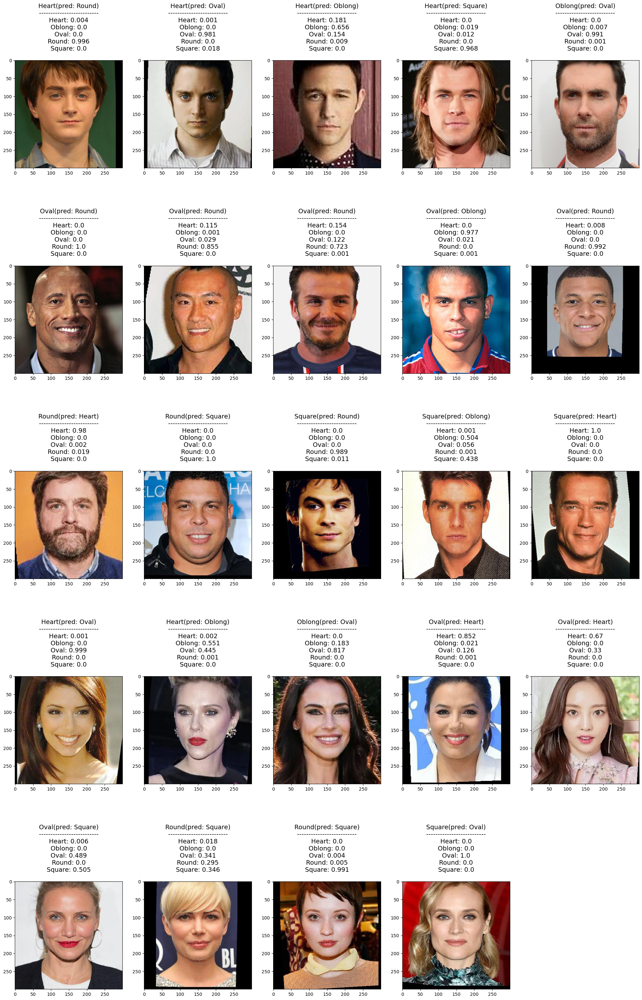

In [171]:
# Missclasified images
plt.figure(figsize = (25,40))

for i in range(0,data_test_miss.shape[0]):
    a = './dataset/testing_set/'+ data_test_miss.values[i][1]+'/'+data_test_miss.values[i][2]+'/'+data_test_miss.values[i][0]+'_NEW_rotated_pts.jpg'
    x = np.ceil(data_test_miss.shape[0]/5)
    plt.subplot(x,5,i+1)
    img = Image.open(a)
    draw = ImageDraw.Draw(img)
    t = data_test_miss.values[i][2]+'(pred: '+data_test_miss.values[i][3] +')'+'\n--------------------------'
    pred=''
    for j in range(0,len(shapes)):
        pred = str(pred) + shapes[j]+': '+str(data_test_miss.values[i][j+4])+'\n'
    plt.title(t+'\n'+pred, fontsize = 14)
    plt.imshow(img)
    img.close()

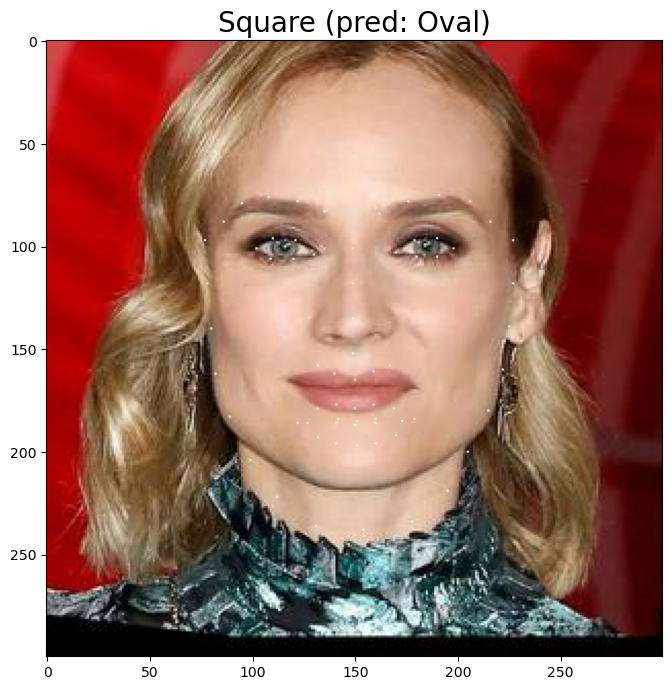

In [189]:
# NOTE: The points are below the chin because of the collar.
i=24
a = './dataset/testing_set/'+ data_test_miss.values[i][1]+'/'+data_test_miss.values[i][2]+'/'+data_test_miss.values[i][0]+'_NEW_rotated_pts.jpg'
plt.figure(figsize = (8,8))
img = Image.open(a)
draw = ImageDraw.Draw(img)
t = data_test_miss.values[i][2]+' (pred: '+data_test_miss.values[i][3]+')'
plt.title(t, fontsize = 20)
plt.imshow(img)
img.close()

### Analysis of the results *MLP 2*

In [180]:
# MLP 2
from sklearn import metrics
from sklearn.preprocessing import StandardScaler  
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.neural_network import MLPClassifier

best_mlp = MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       learning_rate_init=0.01, max_iter=100, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=525,
       shuffle=True, solver='sgd', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

best_mlp.fit(X_train_scaled, y_train)

yhat = best_mlp.predict(X_train_scaled)
yhat2 = best_mlp.predict(X_test_scaled)
yhat2_prob = best_mlp.predict_proba(X_test_scaled)
print('In sample accuracy:',metrics.accuracy_score(yhat, y_train))
print('Out of sample accuracy:',metrics.accuracy_score(yhat2, y_test))

In sample accuracy: 0.9498567335243553
Out of sample accuracy: 0.75


In [181]:
data_test['Prediction']=yhat2
shapes=['Heart', 'Oblong', 'Oval', 'Round', 'Square']
data_test[shapes] = np.around(yhat2_prob, 3)
# MIS-CLASSIFIED
data_test_miss = data_test[data_test['classified_shape']!=data_test['Prediction']][['filename','Sex','classified_shape', 'Prediction','Heart', 'Oblong', 'Oval', 'Round', 'Square']]

In [182]:
data_test_miss

,filename,Sex,classified_shape,Prediction,Heart,Oblong,Oval,Round,Square
0,Heart108.png,Male,Heart,Round,0.389,0.000,0.068,0.475,0.068
1,Heart122.png,Male,Heart,Oval,0.212,0.060,0.709,0.008,0.012
2,Heart140.png,Male,Heart,Oblong,0.143,0.453,0.300,0.029,0.074
6,Heart70.png,Male,Heart,Square,0.111,0.371,0.067,0.008,0.443
11,Oblong103.png,Male,Oblong,Round,0.297,0.178,0.051,0.439,0.035
15,Oblong137.png,Male,Oblong,Round,0.049,0.168,0.277,0.334,0.170
20,Oval101.png,Male,Oval,Round,0.000,0.000,0.029,0.968,0.003
21,Oval116.png,Male,Oval,Oblong,0.020,0.481,0.414,0.009,0.076
26,Oval78.png,Male,Oval,Round,0.342,0.002,0.122,0.458,0.076
27,Oval85.png,Male,Oval,Oblong,0.081,0.889,0.028,0.000,0.001


In [183]:
data_test_miss['Result'] = data_test_miss[['Sex','classified_shape', 'Prediction']].agg('-'.join, axis=1)

In [184]:
pd.value_counts(data_test_miss['Result'])

Female-Oblong-Oval     3
Male-Oval-Round        3
Male-Oval-Oblong       2
Female-Round-Square    2
Male-Oblong-Round      2
Female-Round-Oval      1
Male-Heart-Square      1
Female-Square-Oval     1
Male-Square-Oblong     1
Female-Oval-Square     1
Female-Oval-Heart      1
Female-Round-Heart     1
Male-Heart-Oval        1
Male-Heart-Oblong      1
Female-Heart-Oval      1
Male-Round-Square      1
Male-Heart-Round       1
Female-Oblong-Heart    1
Name: Result, dtype: int64

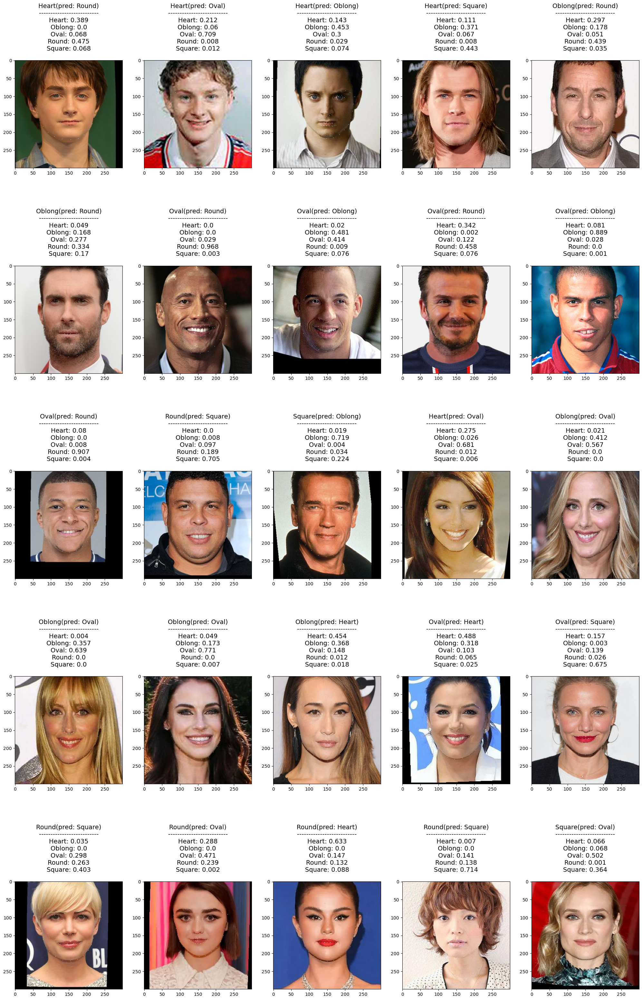

In [185]:
# Missclasified images
plt.figure(figsize = (25,40))

for i in range(0,data_test_miss.shape[0]):
    a = './dataset/testing_set/'+ data_test_miss.values[i][1]+'/'+data_test_miss.values[i][2]+'/'+data_test_miss.values[i][0]+'_NEW_rotated_pts.jpg'
    x = np.ceil(data_test_miss.shape[0]/5)
    plt.subplot(x,5,i+1)
    img = Image.open(a)
    draw = ImageDraw.Draw(img)
    t = data_test_miss.values[i][2]+'(pred: '+data_test_miss.values[i][3] +')'+'\n--------------------------'
    pred=''
    for j in range(0,len(shapes)):
        pred = str(pred) + shapes[j]+': '+str(data_test_miss.values[i][j+4])+'\n'
    plt.title(t+'\n'+pred, fontsize = 14)
    plt.imshow(img)
    img.close()

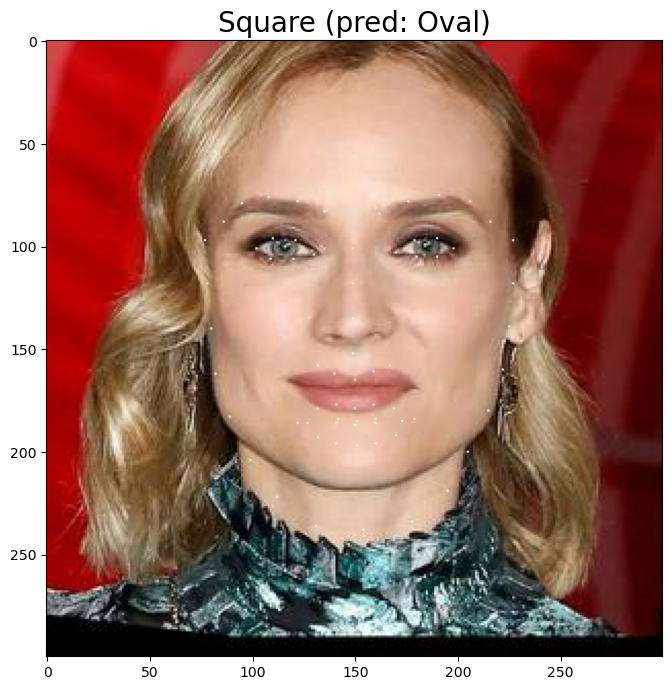

In [188]:
# NOTE: The points are below the chin because of the collar.
i=24
a = './dataset/testing_set/'+ data_test_miss.values[i][1]+'/'+data_test_miss.values[i][2]+'/'+data_test_miss.values[i][0]+'_NEW_rotated_pts.jpg'
plt.figure(figsize = (8,8))
img = Image.open(a)
draw = ImageDraw.Draw(img)
t = data_test_miss.values[i][2]+' (pred: '+data_test_miss.values[i][3]+')'
plt.title(t, fontsize = 20)
plt.imshow(img)
img.close()

### MALE/FEMALE accuracy

In [204]:
# MALE/FEMALE accuracy
X_test_female = data_test[data_test['Sex']=='Female'].drop(['filenum','filename','classified_shape','Sex','Prediction'] , axis = 1)
y_test_female = female_test['classified_shape']

X_test_male = data_test[data_test['Sex']=='Male'].drop(['filenum','filename','classified_shape','Sex','Prediction'] , axis = 1)
y_test_male = male_test['classified_shape']

In [205]:
# Scaling
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled_female = scaler.transform(X_test_female)
X_test_scaled_male = scaler.transform(X_test_male)

In [206]:
## MLP 1
# FEMALE
yhat_f = clf.predict(X_test_scaled_female)
print('Accuracy for Female:',metrics.accuracy_score(yhat_f, y_test_female))


# MALE
yhat_m = clf.predict(X_test_scaled_male)
print('Accuracy for Male:',metrics.accuracy_score(yhat_m, y_test_male))

Accuracy for Female: 0.82
Accuracy for Male: 0.7


In [207]:
## MLP 2
# FEMALE
yhat_f = best_mlp.predict(X_test_scaled_female)
print('Accuracy for Female:',metrics.accuracy_score(yhat_f, y_test_female))


# MALE
yhat_m = best_mlp.predict(X_test_scaled_male)
print('Accuracy for Male:',metrics.accuracy_score(yhat_m, y_test_male))

Accuracy for Female: 0.76
Accuracy for Male: 0.74


### Best Model

We can see that the overall performance of *MLP 2* classifier is better.

## Example

In [191]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import importlib
importlib.reload(mpl); importlib.reload(plt); importlib.reload(sns)

<module 'seaborn' from 'C:\\Users\\karol\\anaconda3\\lib\\site-packages\\seaborn\\__init__.py'>

In [201]:
df = pd.DataFrame(columns = ['0','1','2','3','4','5','6','7','8','9','10','11',	'12',	'13',	'14',	'15',	'16','17',
                             '18',	'19',	'20',	'21',	'22',	'23',	'24','25',	'26',	'27',	'28',	'29',
                             '30',	'31',	'32',	'33',	'34',	'35',	'36',	'37',	'38',	'39',	'40',	'41',
                             '42',	'43',	'44',	'45',	'46',	'47',	'48',	'49',	'50',	'51',	'52',	'53',
                             '54',	'55',	'56',	'57',	'58',	'59',	'60',	'61',	'62',	'63',	'64',	'65',
                             '66',	'67',	'68',	'69',	'70',	'71',	'72',	'73',	'74',	'75',	'76',	'77',
                             '78',	'79',	'80',	'81',	'82',	'83',	'84',	'85',	'86',	'87',	'88',	'89',
                             '90',	'91',	'92',	'93',	'94',	'95',	'96',	'97',	'98',	'99',	'100',	'101',
                             '102',	'103',	'104',	'105',	'106',	'107',	'108',	'109',	'110',	'111',	'112',	'113',
                             '114',	'115',	'116',	'117',	'118',	'119',	'120',	'121',	'122',	'123',	'124',	'125',
                             '126',	'127',	'128',	'129',	'130',	'131',	'132',	'133',	'134',	'135',	'136',	'137',
                             '138',	'139',	'140',	'141',	'142',	'143','A1','A2','A3','A4','A5','A6','A7','A8','A9',
                            'A10','A11','A12','A13','A14','A15','A16','Width','Height','H_W_Ratio','Jaw_width','J_F_Ratio',
                             'MJ_width','MJ_J_width'])

shapes=['Heart', 'Oblong', 'Oval', 'Round', 'Square']

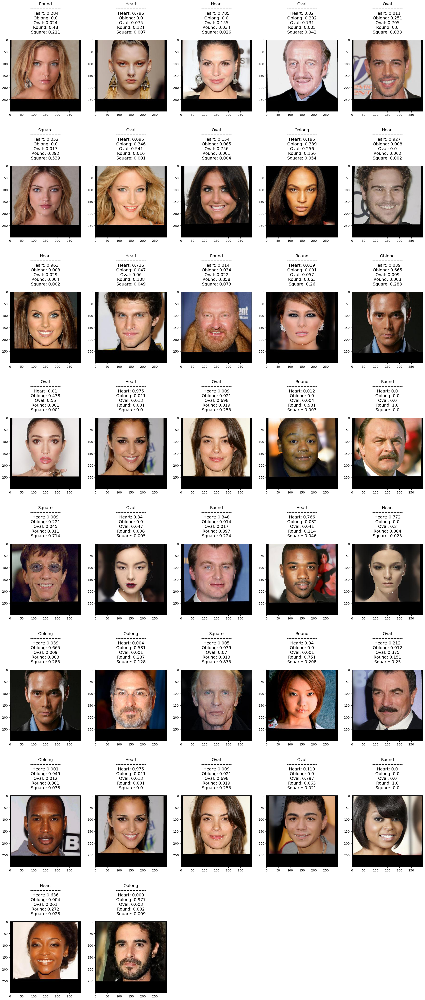

In [210]:
photos = ['./dataset/example_set/5.jpg',
          './dataset/example_set/7.jpg',
          './dataset/example_set/36.jpg',
          './dataset/example_set/37.jpg',
          './dataset/example_set/39.jpg',
          './dataset/example_set/66.jpg',
          './dataset/example_set/72.jpg',
          './dataset/example_set/74.jpg',
          './dataset/example_set/103.jpg',
          './dataset/example_set/28673.jpg',
          './dataset/example_set/28753.jpg',
          './dataset/example_set/28766.jpg',
          './dataset/example_set/28866.jpg',
          './dataset/example_set/29254.jpg',
          './dataset/example_set/10614.jpg',
          './dataset/example_set/29585.jpg',
          './dataset/example_set/29620.jpg',
          './dataset/example_set/29643.jpg',
          './dataset/example_set/10.jpg',
          './dataset/example_set/1007.jpg',
          './dataset/example_set/10000.jpg',
          './dataset/example_set/10014.jpg',
          './dataset/example_set/10040.jpg',
          './dataset/example_set/10042.jpg',
          './dataset/example_set/10053.jpg',
          './dataset/example_set/10614.jpg',
          './dataset/example_set/11115.jpg',
          './dataset/example_set/28943.jpg',
          './dataset/example_set/28955.jpg',
          './dataset/example_set/29194.jpg',
          './dataset/example_set/29542.jpg',
          './dataset/example_set/29620.jpg',
          './dataset/example_set/29643.jpg',
          './dataset/example_set/29786.jpg',
          './dataset/example_set/29790.jpg',
          './dataset/example_set/29817.jpg',
          './dataset/example_set/28295.jpg']

plt.figure(figsize = (25,60))
for i in range(0,len(photos)):
    file_num = i+1
    my_photo = photos[i]
    make_face_df_save(my_photo,file_num,df)
    
    dfc = df
    test_row = dfc.loc[file_num].values.reshape(1,-1)
    test_row = scaler.transform(test_row)  
    test_shape = best_mlp.predict(test_row)
    test_shape_prob = np.around(best_mlp.predict_proba(test_row), 3)
    #print(test_shape)
    
    x = np.ceil(len(photos)/5)
    plt.subplot(x,5,i+1)
    #plt.figure(figsize = (6,6))
    new_photo = my_photo+'_NEW_rotated_pts.jpg'
    img = Image.open(new_photo)
    draw = ImageDraw.Draw(img)
    
    t = test_shape[0]+'\n--------------------'
    pred=''
    for j in range(0,len(shapes)):
        pred = str(pred) + shapes[j]+': '+str(test_shape_prob[0][j])+'\n'
        
    plt.title(t+'\n'+pred, fontsize = 14)
    plt.imshow(img)
    img.close()

## Recommendation

In [ ]:
## NEED TO CHANGE DIRECTORY

import requests
from PIL import Image, ImageDraw,ImageFont
import face_recognition
import pandas as pd
import numpy as np
from os.path import basename
import math
import pathlib
from pathlib import Path
import os
import random
import matplotlib.pyplot as plt
import uuid

#image_dir = "Hair_Style_Recommendation-master/data/rec_pics"
image_dir = "Face_Shape_Dataset/rec_pics"

style_df = pd.DataFrame()
style_df = pd.DataFrame(columns = ['face_shape','hair_length','location','filename','score'])

def process_rec_pics(style_df,image_dir = "Face_Shape_Dataset/rec_pics"):
    image_root = "Face_Shape_Dataset/rec_pics"
    #image_root = "Face_Shape_Dataset/rec_pics"
    dir_list = ['Heart','Oblong','Oval','Square','Round']
    filenum = 0   
    for dd in dir_list: 
            image_dir = image_root + '/' + dd
            sub_dir = [q for q in pathlib.Path(image_dir).iterdir() if q.is_dir()]
            #print(sub_dir)
            start_j = 0
            end_j = len(sub_dir)

            for j in range(start_j, end_j):
                    #images_dir = [p for p in pathlib.Path(sub_dir[j]).iterdir() if p.is_file()]

                    for p in pathlib.Path(sub_dir[j]).iterdir():
                        shape_array= []

                        face_shape = os.path.basename(os.path.dirname(os.path.dirname(p)))
                        hair_length = os.path.basename(os.path.dirname(p)) 
                        sub_dir_file = p
                        face_file_name = os.path.basename(p)

                        shape_array.append(face_shape)
                        shape_array.append(hair_length)
                        shape_array.append(sub_dir_file)
                        shape_array.append(face_file_name)  
                        
                        random.seed(filenum)  # this keeps the score the same each time I run it
                        rand = random.randint(25,75)  # make a random score to start the rec. engine
                        shape_array.append(rand)

                        style_df.loc[filenum] = np.array(shape_array)

                        filenum += 1
    return(filenum)

process_rec_pics(style_df)

style_df
#print(style_df)

def run_recommender(test_shape):
    face_shape_input = test_shape
    if face_shape_input not in ['Heart','Oblong','Oval','Round','Square']:
        face_shape_input = input("What is your face shape?")
    updo_input = input("Would you like to see up-dos? (Y/N)")
    if updo_input in ['n','no','N','No','NO']:
            hair_length_input = input("Is your hair short or long?")
            if hair_length_input in ['short','Short','s','S']:
                hair_length_input = 'Short'
            if hair_length_input in ['long','longer','l','L']:
                hair_length_input = 'Long'
    else: hair_length_input = 'Updo'
    
    print(hair_length_input)
    print(face_shape_input)
    r = 6
    
    n_col = 3
    n_row = 2
    recommended_df = style_df.loc[(style_df['face_shape'] ==face_shape_input) & (style_df['hair_length']==hair_length_input)].sort_values('score', ascending = 0).reset_index(drop=True)
    recommended_df = recommended_df.head(r)
    
    plt.figure(figsize=(5 * n_col, 4 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)    
    font = ImageFont.truetype("fonts/Arial.ttf", 60)
    for p in range(0,r):
        idea = str(recommended_df.iloc[p]['location'])
        idea = idea.replace('\\', '/')
        img = Image.open(idea)
        plt.subplot(n_row, n_col, p+1 )
        draw = ImageDraw.Draw(img)
        plt.title(p+1,fontsize = 40)
        #plt.xlabel(recommended_df.iloc[p]['score'],fontsize = 20)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(img)
        img.close()

    plt.show()
    
    fav = input("Which style is your favorite? ")
    fav_loc = str(recommended_df.iloc[int(fav)-1]['location'])
    print('\n',fav_loc)
    #yuck = input("Which style is your least favorite? ")
    # update scores based on fav/least fav
